In [1]:
# Load libraries
import os
os.environ["USE_PYGEOS"] = '0'
import numpy as np
import pandas as pd
#pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from pylab import rcParams
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 72

import seaborn as sns
sns.set_style("darkgrid")
sns.set_context(context="paper", font_scale=1.5, rc=None)
sns.set(font="serif")
from sklearn import preprocessing
from sklearn.preprocessing import OrdinalEncoder
#import plotly.express as px
#import plotly.graph_objects as go

import geopandas as gpd

import warnings
#warnings.filterwarnings('ignore') 
import time

# IMPORT DATA

In [2]:
def read_csv(run:int, object:str, dropIndex = True):
    if dropIndex:
        return pd.read_csv(f"data/trees/{str(run)}{object}.csv").drop(columns=["Unnamed: 0"])
    else:
        return pd.read_csv(f"data/trees/{str(run)}{object}.csv")

In [3]:
class residualsClass:
    def __init__(self, run):
        self.values = read_csv(run, "residuals_values").rename(columns={"x":"values"})
        self.values_median = read_csv(run, "residuals_values_median")
        self.values_repetitions = read_csv(run, "residuals_values_repetitions")

class evaluationClass:
    def __init__(self, run):
        self.PLACEHOLDER = 0

class predictionClass:
    def __init__(self, run):
        self.values = read_csv(run, "predictions_values").rename(columns={"x":"values"})
        self.values_per_repetion = read_csv(run, "prediction_values_per_repetition")
        self.values_median = read_csv(run, "prediction_values_median")

class importanceClass:
    def __init__(self, run):
        self.per_variable = read_csv(run, "importance_per_variable")
        self.per_repetition = read_csv(run, "importance_per_repetition")
        self.local = read_csv(run, "importance_local")



In [4]:
class treeRepeat:
    def __init__(self, run):
        
        self.num_trees = read_csv(run, "num_trees").iloc[0,0]
        self.num_independent_variables = read_csv(run, "num_independent_variables").iloc[0,0]
        self.mtry = read_csv(run, "mtry").iloc[0,0]
        self.min_node_size = read_csv(run, "min_node_size").iloc[0,0]
        self.variable_importance = read_csv(run, "variable_importance")
        self.variable_importance_local = read_csv(run, "variable_importance_local")
        self.prediction_error = read_csv(run, "prediction_error").iloc[0,0]
        self.r_squared = read_csv(run, "r_squared").iloc[0,0]
        self.num_samples = read_csv(run, "num_samples").iloc[0,0]
        self.performance = read_csv(run, "performance")
        self.residuals = residualsClass(run)
        self.evaluation = evaluationClass(run)
        self.predictions = predictionClass(run)
        self.importance = importanceClass(run)

treeResult = treeRepeat(run=2)


In [5]:
# Load  dataset 
gdf  = gpd.read_file('data/nb_df.gpkg')

# Filtering bools
bools= gdf.select_dtypes(include=['bool'])

# enc = OrdinalEncoder()
# bools_encoded = enc.fit_transform(bools)
# bools_encoded = pd.DataFrame(bools_encoded, columns = bools.columns)

# # removing old bools
gdf = gdf.drop(bools.columns, axis = 1)
gdf = gdf.reset_index(drop = True)

#Adding encoded bools
# gpd.GeoDataFrame(pd.concat([gdf, bools_encoded], axis = 1))
gdf

,bedrooms,bathrooms,half_bathrooms,lot_size,construction_size,age,property_type_id_id,real_age,latitude,longitude,...,historic,museum,airport,industry,subway,bus,id_right,price,price_small,geometry
0,1.607506,3.795655,-0.782058,-0.090367,0.101543,0.274983,1.361425,2.965947,1.189645,-0.527365,...,-0.030999,0.142419,-0.086261,-0.280822,-0.360175,-0.457558,8,3.400000e+06,3.400000,"MULTIPOLYGON (((2793299.849 832180.730, 279330..."
1,-0.789660,-1.259302,-0.782058,-0.164097,-0.170815,-0.151405,-0.961014,0.167806,0.928072,-0.362927,...,-0.273689,-0.313227,-0.352554,-0.992470,-0.777304,-0.857703,16,2.539500e+06,2.539500,"MULTIPOLYGON (((2794357.004 830240.705, 279438..."
2,-1.588716,-1.259302,-0.782058,-0.141148,-0.147499,-0.342970,-0.961014,-1.089330,0.628836,-0.654206,...,-0.918067,-0.833031,-0.101611,0.366546,-0.586630,0.407494,33,6.950000e+06,6.950000,"MULTIPOLYGON (((2792835.890 828193.326, 279284..."
3,5.602784,1.773672,-0.782058,-0.071812,0.169013,-0.342970,1.361425,-1.089330,0.492163,0.801185,...,-0.400672,-0.088077,-1.532088,-0.895682,-0.684277,-0.365462,34,7.000000e+06,7.000000,"MULTIPOLYGON (((2801132.447 826978.129, 280115..."
4,0.009395,-0.248311,-0.782058,-0.089390,-0.104834,-0.046353,1.361425,0.857203,0.946030,-0.581633,...,-0.471636,-0.921843,-0.131758,-0.528284,-0.702726,-0.678414,35,4.250000e+06,4.250000,"MULTIPOLYGON (((2793254.156 830422.310, 279325..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
694,0.009395,0.560482,1.531052,0.321350,0.125157,-0.177359,1.361425,-0.002516,-1.787337,0.108172,...,0.981668,1.568479,1.463781,2.170619,1.131246,-0.605667,1559,5.742400e+06,5.742400,"MULTIPOLYGON (((2796977.276 808648.302, 279697..."
695,0.009395,0.762681,1.145533,-0.047887,0.000835,-0.293534,1.361425,-0.764908,-0.834495,0.677211,...,-0.623495,-0.368603,0.021319,-0.692475,-0.637533,-0.342341,1561,8.500000e+06,8.500000,"MULTIPOLYGON (((2800395.769 816279.216, 280039..."
696,0.808451,0.762681,1.145533,-0.019078,0.075746,-0.021635,1.361425,1.019414,-0.875106,0.765444,...,-1.096245,0.074720,0.046001,-0.401229,-0.435141,-0.669519,1562,7.700000e+06,7.700000,"MULTIPOLYGON (((2800691.441 815947.949, 280075..."
697,0.009395,1.268176,1.145533,-0.058141,-0.001149,0.058699,1.361425,1.546600,-1.318348,-0.281820,...,-0.162428,-0.217427,1.080662,1.123871,0.560929,1.742792,1563,7.200000e+06,7.200000,"MULTIPOLYGON (((2794204.043 812033.062, 279422..."


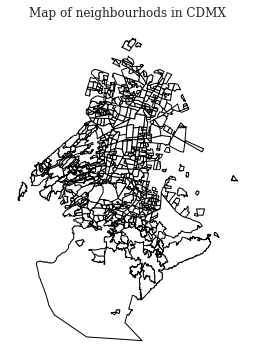

In [6]:
fig, ax = plt.subplots(figsize=(6, 6))
gdf.plot(color = 'white', edgecolor = 'black', ax = ax)
#gdf.centroid.plot(ax = ax)
ax.set_title('Map of neighbourhods in CDMX', fontsize=12)
ax.axis("off")
plt.show()


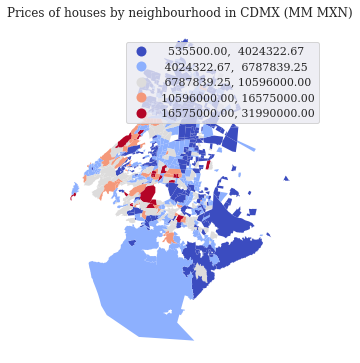

In [7]:
fig, ax = plt.subplots(figsize=(6, 6))
gdf.plot(column='price', cmap = 'coolwarm', linewidth=0.01, scheme = 'FisherJenks', k=5, legend=True, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=ax)
ax.set_title('Prices of houses by neighbourhood in CDMX (MM MXN)', fontsize=12)
ax.axis("off")
plt.show()

# Load the R data

In [8]:
tree_Importance = treeResult.importance.local
tree_prediction = treeResult.predictions.values_per_repetion

def getMean(x):
    return np.mean(x)

def getStd(x):
    return np.std(x)

reps = tree_prediction.columns.to_list()
tree_prediction["mean"] = tree_prediction[reps].apply(lambda x: getMean(x), axis=1)
tree_prediction["std"] = tree_prediction[reps].apply(lambda x: getStd(x), axis=1)
tree_prediction

gdf['price_mean'] = tree_prediction["mean"]
gdf['price_std'] = tree_prediction["std"]
tree_prediction

,repetition_1,repetition_2,repetition_3,repetition_4,repetition_5,repetition_6,repetition_7,repetition_8,repetition_9,repetition_10,mean,std
0,5.001470,5.076939,5.154776,5.061679,5.116620,5.248916,5.199638,5.181798,5.205116,5.232739,5.147969,0.077096
1,2.312622,2.312517,2.303800,2.308254,2.332033,2.283605,2.303386,2.339315,2.322715,2.320193,2.313844,0.015026
2,5.393254,5.233583,5.082656,5.303921,5.264794,5.266806,5.278903,5.341100,5.205652,5.313742,5.268441,0.079980
3,6.761668,6.816984,6.844044,6.812333,6.897566,6.849478,6.892994,6.809305,6.797330,6.829384,6.831109,0.039679
4,4.642155,4.633563,4.647029,4.594188,4.598318,4.636768,4.601282,4.520718,4.530164,4.555460,4.595964,0.044147
...,...,...,...,...,...,...,...,...,...,...,...,...
696,6.748990,6.719219,6.892809,6.942013,6.999242,6.849609,6.821705,6.929269,6.719964,6.768450,6.839127,0.094520
697,8.012475,7.924708,7.960378,7.929177,7.974682,7.977085,8.120151,7.977129,8.001233,7.997856,7.987487,0.051939
698,7.881278,7.850127,7.814726,7.855783,7.821508,7.811129,7.780280,7.729468,7.825091,7.845184,7.821458,0.040576
699,6.839259,6.928591,6.920979,6.885667,6.858798,6.821591,6.898095,6.887254,6.796022,6.845788,6.868204,0.040994


In [9]:
def pTest(val, mean, std, sigma=2):
    return (val - mean)
    #return int(np.abs((val - mean)/std) > sigma)

In [10]:
gdf["p-test"] = gdf[["price", "price_mean", "price_std"]].apply(lambda x: pTest(x[0], x[1],x[2]), axis=1)

<AxesSubplot: >

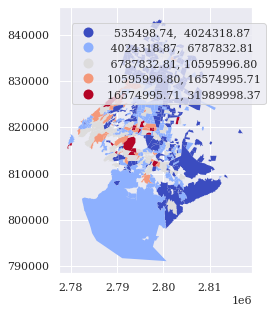

In [11]:
gdf.plot(column=("p-test"), cmap = 'coolwarm', linewidth=0.01, scheme = 'FisherJenks', k=5, legend=True, legend_kwds={'bbox_to_anchor':(1.10, 0.96)})


# Fit GWR model

In [12]:
for column in tree_Importance.columns:
    gdf[f"importance_{column}"] = tree_Importance[column]
gdf["importance_bedrooms"]

0      0.982585
1      0.125063
2      0.408080
3      0.487839
4      0.522961
         ...   
694    0.339751
695    0.141194
696    0.112689
697    0.404289
698    0.810372
Name: importance_bedrooms, Length: 699, dtype: float64

In [15]:
# TODO change to sf_result
# Add R2 to GeoDataframe 
# gdf['gwr_R2'] = gwr_results.localR2

In [16]:
# TODO change to RF
# fig, ax = plt.subplots(figsize=(6, 6))
# gdf.plot(column='gwr_R2', cmap = 'coolwarm', linewidth=0.01, scheme = 'FisherJenks', k=5, legend=True, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=ax)
# ax.set_title('Local R2', fontsize=12)
# ax.axis("off")
# gdf.explore()
# plt.show()

# Plot coefficients

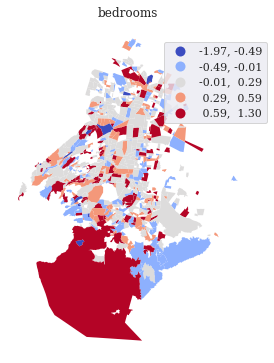

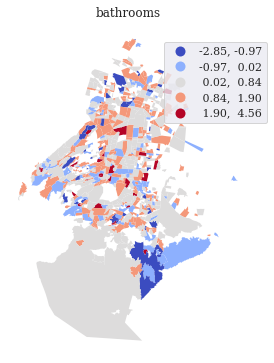

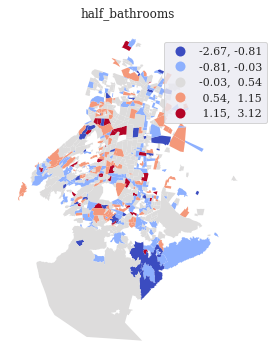

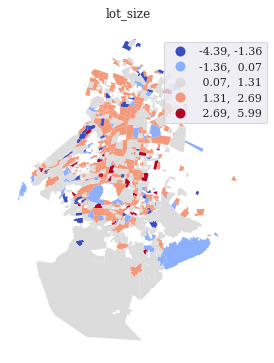

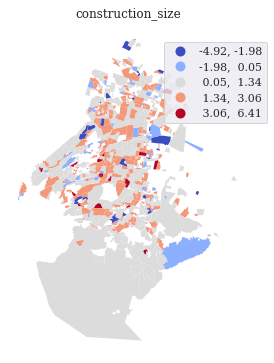

...

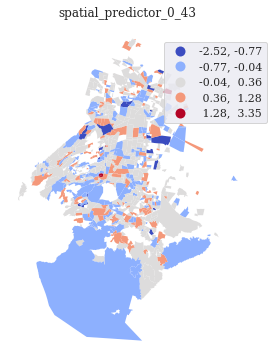

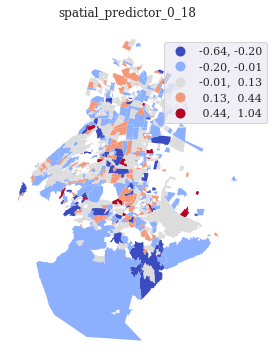

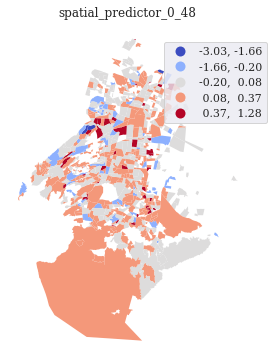

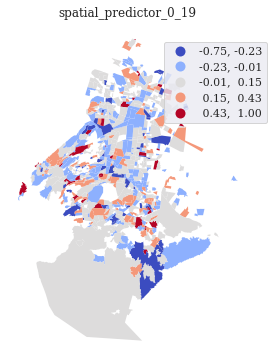

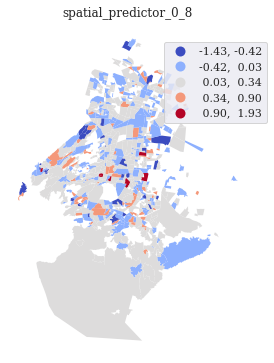

In [14]:
coef_names = tree_Importance.columns
for i in coef_names:
    fig, ax = plt.subplots(figsize=(6, 6))
    gdf.plot(column=("importance_" + i), cmap = 'coolwarm', linewidth=0.01, scheme = 'FisherJenks', k=5, legend=True, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=ax)
    ax.set_title(i, fontsize=12)
    ax.axis("off")
    #plt.savefig('myMap.png',dpi=150, bbox_inches='tight')
    plt.show()

In [17]:
# # Filter t-values: standard alpha = 0.05
# gwr_filtered_t = gwr_results.filter_tvals(alpha = 0.05)

In [18]:
# pd.DataFrame(gwr_filtered_t)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35
0,0.000000,0.000000,5.328285,7.622939,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-2.649516,0.0,0.000000,2.992906,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,-3.728239,3.400287,4.351372,0.000000,0.0
1,0.000000,0.000000,5.606729,8.435574,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-2.558723,0.0,0.000000,3.107628,0.0,0.0,0.000000,0.000000,0.0,0.000000,-2.052324,-3.484816,3.418217,4.474380,0.000000,0.0
2,0.000000,0.000000,6.702092,9.556943,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-2.335046,0.0,0.000000,3.993033,0.0,0.0,0.000000,-2.570763,0.0,0.000000,0.000000,-2.672517,2.953712,5.181020,-2.507022,0.0
3,2.412698,0.000000,7.371043,7.450758,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,-2.576611,2.236793,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,-3.174046,0.000000,3.116796,0.000000,0.0
4,0.000000,0.000000,5.861772,8.737942,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-2.568656,0.0,0.000000,3.443868,0.0,0.0,0.000000,0.000000,0.0,0.000000,-1.975194,-3.415625,3.381077,4.721547,-2.003861,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
696,4.741526,-2.462100,9.030539,7.824386,0.000000,2.653355,0.0,0.0,2.915767,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-3.217373,0.0,-2.990159,0.000000,0.0,0.0,-5.541320,0.000000,0.0,-2.630859,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
697,3.373668,0.000000,8.095958,8.008405,2.367840,2.395420,0.0,0.0,2.743440,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-2.464499,0.0,0.000000,0.000000,0.0,0.0,-5.009129,-1.981224,0.0,-3.971985,0.000000,-3.431741,0.000000,0.000000,0.000000,0.0
698,3.278947,0.000000,8.007473,7.873563,2.413330,2.303230,0.0,0.0,2.809870,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-2.505697,0.0,0.000000,0.000000,0.0,0.0,-4.829815,0.000000,0.0,-3.924800,0.000000,-3.334254,0.000000,0.000000,0.000000,0.0
699,5.590563,-2.985674,10.388204,8.804667,2.121115,2.945338,0.0,0.0,2.502893,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.054680,0.0,0.0,-2.900099,0.0,-2.669723,0.000000,0.0,0.0,-6.580160,0.000000,0.0,-2.935552,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


In [19]:
# Filter t-values: corrected alpha due to multiple testing
gwr_filtered_tc = gwr_results.filter_tvals()

In [20]:
pd.DataFrame(gwr_filtered_tc)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35
0,0.000000,0.000000,5.328285,7.622939,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.649516,0.0,0.000000,2.992906,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,-3.728239,3.400287,4.351372,0.000000,0.0
1,0.000000,0.000000,5.606729,8.435574,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.558723,0.0,0.000000,3.107628,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,-3.484816,3.418217,4.474380,0.000000,0.0
2,0.000000,0.000000,6.702092,9.556943,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,3.993033,0.0,0.0,0.000000,-2.570763,0.0,0.000000,0.0,-2.672517,2.953712,5.181020,-2.507022,0.0
3,2.412698,0.000000,7.371043,7.450758,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,-2.576611,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,-3.174046,0.000000,3.116796,0.000000,0.0
4,0.000000,0.000000,5.861772,8.737942,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.568656,0.0,0.000000,3.443868,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,-3.415625,3.381077,4.721547,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
696,4.741526,-2.462100,9.030539,7.824386,0.00000,2.653355,0.0,0.0,2.915767,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.217373,0.0,-2.990159,0.000000,0.0,0.0,-5.541320,0.000000,0.0,-2.630859,0.0,0.000000,0.000000,0.000000,0.000000,0.0
697,3.373668,0.000000,8.095958,8.008405,0.00000,2.395420,0.0,0.0,2.743440,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.464499,0.0,0.000000,0.000000,0.0,0.0,-5.009129,0.000000,0.0,-3.971985,0.0,-3.431741,0.000000,0.000000,0.000000,0.0
698,3.278947,0.000000,8.007473,7.873563,2.41333,0.000000,0.0,0.0,2.809870,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.505697,0.0,0.000000,0.000000,0.0,0.0,-4.829815,0.000000,0.0,-3.924800,0.0,-3.334254,0.000000,0.000000,0.000000,0.0
699,5.590563,-2.985674,10.388204,8.804667,0.00000,2.945338,0.0,0.0,2.502893,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.900099,0.0,-2.669723,0.000000,0.0,0.0,-6.580160,0.000000,0.0,-2.935552,0.0,0.000000,0.000000,0.000000,0.000000,0.0


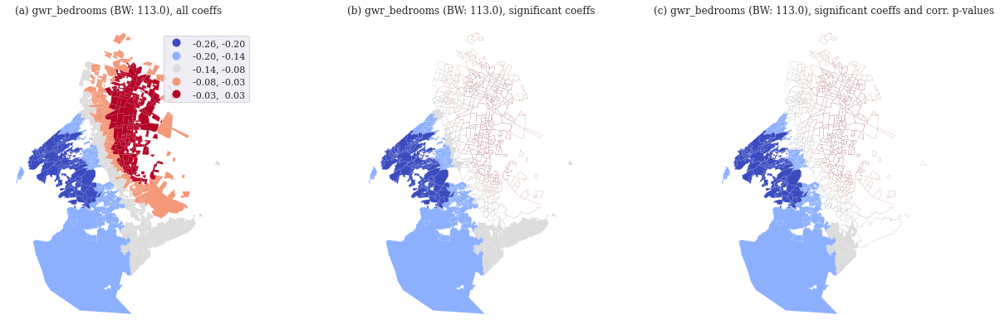

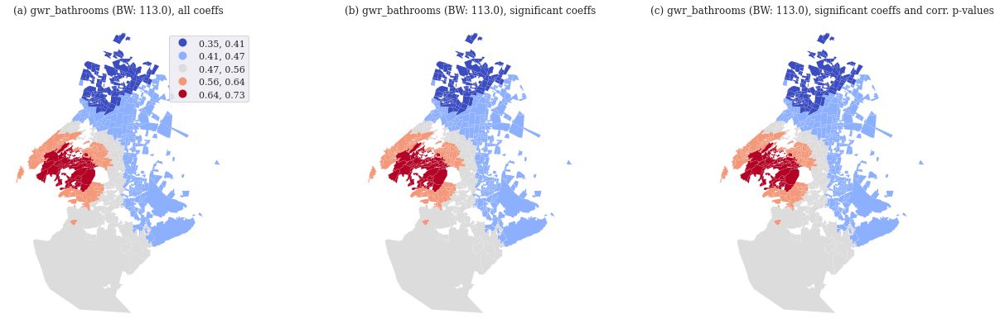

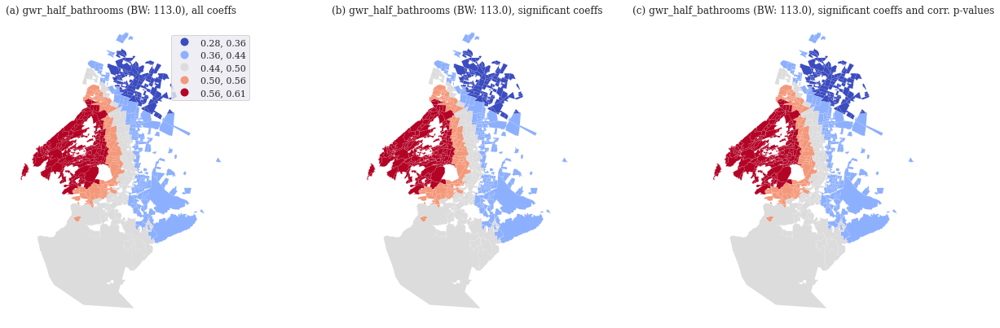

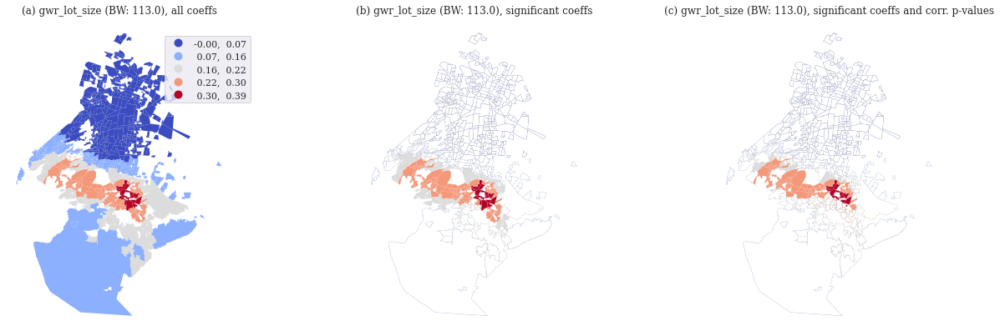

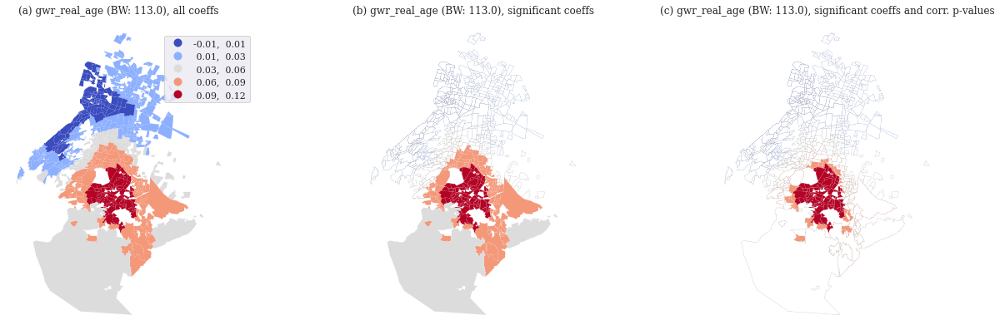

...

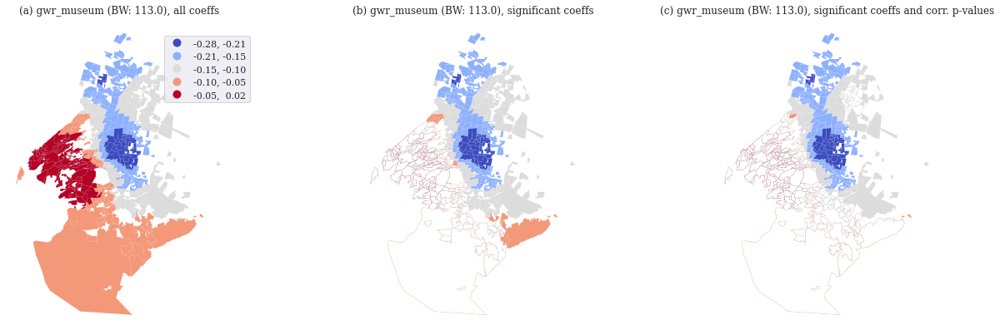

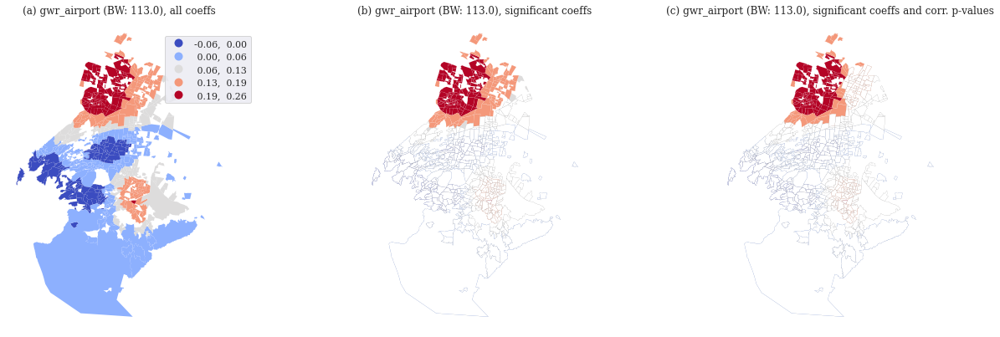

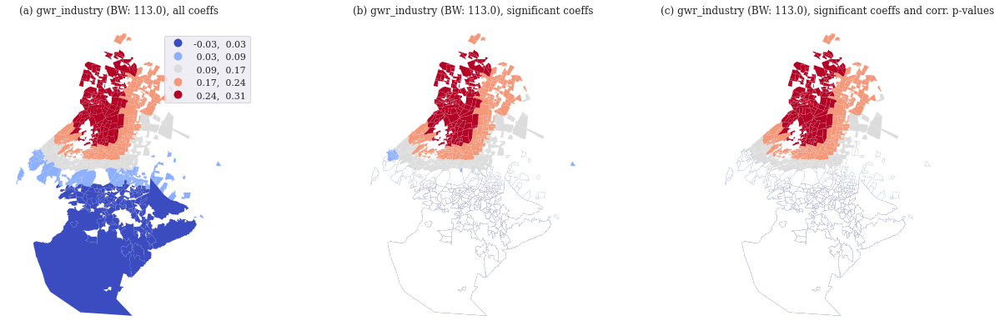

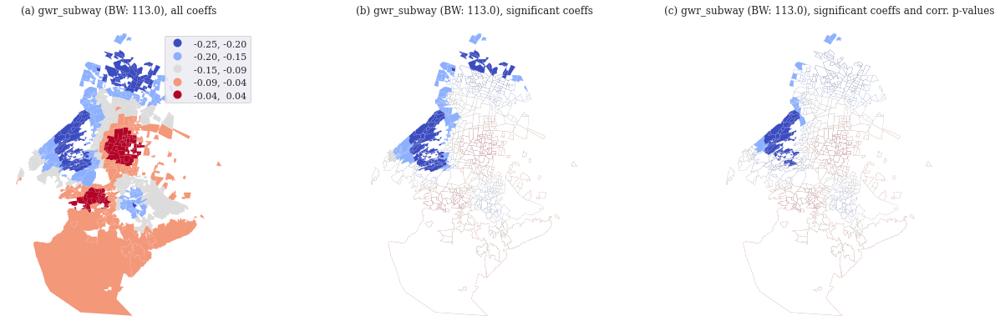

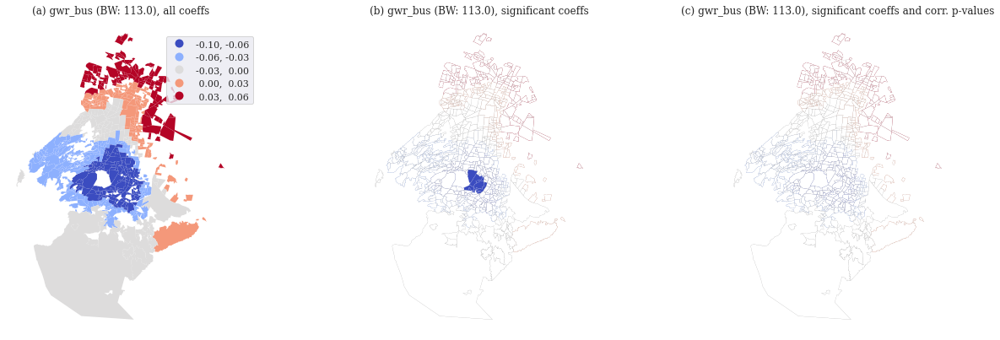

In [21]:
for num,col in enumerate (coef_names):
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18,6))

    gdf.plot(column= col, cmap = 'coolwarm', linewidth=0.01, scheme = 'FisherJenks', k=5, legend=True, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=axes[0])

    gdf.plot(column= col, cmap = 'coolwarm', linewidth=0.05, scheme = 'FisherJenks', k=5, legend=False, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=axes[1])
    gdf[gwr_filtered_t[:,num+1] == 0].plot(color='white', linewidth=0.05, edgecolor='black', ax=axes[1])


    gdf.plot(column= col, cmap = 'coolwarm', linewidth=0.05, scheme = 'FisherJenks', k=5, legend=False, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=axes[2])
    gdf[gwr_filtered_tc[:,num+1] == 0].plot(color='white', linewidth=0.05, edgecolor='black', ax=axes[2])

    plt.tight_layout()

    axes[0].axis("off")
    axes[1].axis("off")
    axes[2].axis("off")

    axes[0].set_title('(a) '+ col +' (BW: ' + str(gwr_bw) +'), all coeffs', fontsize=12)
    axes[1].set_title('(b) '+ col+' (BW: ' + str(gwr_bw) +'), significant coeffs',     fontsize=12)
    axes[2].set_title('(c) '+col +' (BW: ' + str(gwr_bw) +'), significant coeffs and corr. p-values',     fontsize=12)
    plt.show()